실행 전 해야할 것 :

```
python -m ensurepip --upgrade
uv pip install iterative-stratification
uv pip install pycocotools
uv pip install faster-coco-eval
uv pip install torchmetrics[detection]
```

## STEP 1 : 데이터 전처리

### 모듈 다운로드

### 데이터 다운로드 from kaggle

### EDA
**Train 이미지 - Annotation**
- 수량 확인 및 비교
- 클래스 별 이미지 분포 (표 & 그래프)
- Mapping -> Visualization -> Mapping 검증

### Transform ~ Dataset ~ DataLoader

In [1]:
#@title 구글 드라이브 연결
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!unzip -q "/content/drive/MyDrive/t_proj/아카이브.zip" -d "/content/data"

replace /content/data/__MACOSX/._test_images? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [3]:
#@title wandb 다운
!pip install -q wandb

In [4]:
!pip install -q torchmetrics pycocotools iterative-stratification

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 17.5 MB/s eta 0:00:00


In [5]:
!ls "/content/data"

__MACOSX  test_images  train_annotations  train_images


In [6]:
#@title Import Module
import os
import cv2
import csv
import glob
import json
import random
import seaborn as sns
import kagglehub
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import pandas as pd

import torch
import torchvision

from torchvision import tv_tensors
from torchvision.transforms import v2
from torch.utils.data import Dataset, DataLoader
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.models.detection import _utils as det_utils

from sklearn.model_selection import train_test_split
from sklearn.metrics import average_precision_score

from PIL import Image
from tqdm import tqdm
from collections import defaultdict
from functools import partial

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection import _utils as det_utils
import wandb

In [7]:
#@title Colab 한글 폰트 설정

!apt-get -qq update
!apt-get -qq install fonts-nanum

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# Matplotlib 폰트 캐시 갱신
fm.fontManager.addfont(
    "/usr/share/fonts/truetype/nanum/NanumGothic.ttf"
)

plt.rcParams["font.family"] = "NanumGothic"
plt.rcParams["axes.unicode_minus"] = False

print("한글 폰트 설정 완료")

W: https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2404/x86_64/InRelease: Key is stored in legacy trusted.gpg keyring (/etc/apt/trusted.gpg), see the DEPRECATION section in apt-key(8) for details.
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu noble InRelease' does not seem to provide it (sources.list entry misspelt?)
한글 폰트 설정 완료


In [8]:
#@title wandb login
wandb.login()            #Api key generate 후 입력

/usr/local/lib/python3.13/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results


wandb: Enter your choice: 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.


wandb: Paste your API key and hit enter: ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: jaedong0817 (jaedong0817-) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [9]:
#@title Device 및 속도 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PIN_MEMORY = device.type == "cuda"
AMP_ENABLED = device.type == "cuda"

if AMP_ENABLED:
    # 모든 원본 이미지가 같은 크기이므로, 첫 batch 이후 더 빠른 cuDNN kernel을 사용
    torch.backends.cudnn.benchmark = True

VAL_EVERY = 3
NUM_WORKERS = 0  # Windows/Jupyter 안정 기본값; 정상 완주 후 2까지 시험 가능

print(f"device: {device}")

device: cuda


In [10]:
#@title 실험 설정

#실험마다 여기서 설정을 변경하시면 됩니다.
EXPERIMENT_NAME = "faster_rcnn_w_newdata(durg)"

LEARNING_RATE = 3e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 0.0005

NUM_EPOCHS = 10
TRAIN_BATCH_SIZE = 8
EVAL_BATCH_SIZE = 8

# balanced=True: 속도를 우선하는 448px 입력. mAP가 많이 떨어지면 False로 바꾸세요.
USE_BALANCED_SPEED = False
MODEL_MIN_SIZE = 448 if USE_BALANCED_SPEED else 512
MODEL_MAX_SIZE = 640 if USE_BALANCED_SPEED else 800

SCHEDULER_FACTOR = 0.5
SCHEDULER_PATIENCE = 4

RPN_PRE_NMS_TOP_N_TRAIN = 1000
RPN_POST_NMS_TOP_N_TRAIN = 1000
BOX_DETECTIONS_PER_IMG = 20

print(f"input min_size: {MODEL_MIN_SIZE}")

input min_size: 512


In [10]:
#@title Image, Annotation 경로 설정
#kagglehub.login()
#path = kagglehub.competition_download("ai14-level-project")
#path = os.path.join(path, "sprint_ai_project1_data")
#print(path)

#image_dir = glob.glob(os.path.join(path, "train_images", "*.png"))

#annotation_dir = glob.glob(
#    os.path.join(path, "train_annotations", "**", "*.json"),
#    recursive=True
#)

#print(f"Train 이미지 수 : {len(image_dir)}, Annotation 수 : {len(annotation_dir)}")

In [11]:
# 압축 해제한 로컬 Colab 데이터 사용
path = "/content/data"

image_dir = glob.glob(
    os.path.join(path, "train_images", "*.png")
)

annotation_dir = glob.glob(
    os.path.join(path, "train_annotations", "**", "*.json"),
    recursive=True
)

print(f"Train 이미지 수 : {len(image_dir)}")
print(f"Annotation 수 : {len(annotation_dir)}")

Train 이미지 수 : 3735
Annotation 수 : 14221


In [12]:
#Cell 4 수정(1:1 mapping 코드 -> 1:n mapping 코드)
#@title Image-Annotation Mapping (stem 기준)

# 이미지 stem -> 이미지 경로
image_stem_to_path = {
    os.path.splitext(os.path.basename(image_path))[0]: image_path
    for image_path in image_dir
}

# 이미지 stem -> 여러 annotation JSON 경로
stem_to_paths = defaultdict(list)

for annotation_path in annotation_dir:
    stem = os.path.splitext(os.path.basename(annotation_path))[0]
    stem_to_paths[stem].append(annotation_path)

# 이미지와 annotation이 모두 존재하는 stem만 사용
valid_stems = [
    stem
    for stem in stem_to_paths
    if stem in image_stem_to_path
]

# 매핑되지 않는 데이터 확인
images_without_annotation = (
    set(image_stem_to_path) - set(stem_to_paths)
)

annotations_without_image = (
    set(stem_to_paths) - set(image_stem_to_path)
)

print(f"Annotation이 없는 Train 이미지 수: {len(images_without_annotation)}")
print(f"Train 이미지가 없는 Annotation stem 수: {len(annotations_without_image)}")
print(f"매핑 가능한 이미지 수: {len(valid_stems)}")

Annotation이 없는 Train 이미지 수: 4
Train 이미지가 없는 Annotation stem 수: 0
매핑 가능한 이미지 수: 3731


In [13]:
#@title 이미지 해상도 파악
sizes = set()
for img_path in image_dir[:50]:  # 200장이면 전수 조사해도 됨: image_dir 전체로
    with Image.open(img_path) as im:
        sizes.add(im.size)  # (width, height)

print(f"고유 해상도 종류 수: {len(sizes)}")
print(sizes if len(sizes) < 10 else list(sizes)[:10])

고유 해상도 종류 수: 1
{(976, 1280)}


In [14]:
#@title 이미지 단위 Annotation 병합 (실제 클래스는 dl_mapping_code 기준)

def build_image_records(valid_stems, stem_to_paths):
    image_records = {}
    category_id_to_name = {}  # dl_mapping_code -> dl_name

    for stem in valid_stems:
        img_info = None
        annotations = []

        for annotation_path in stem_to_paths[stem]:
            with open(annotation_path, "r", encoding="utf-8") as f:
                data = json.load(f)

            # 이 JSON이 담당하는 실제 약품 정보
            file_img = data["images"][0]
            drug_code = file_img["dl_mapping_code"]
            drug_name = file_img["dl_name"]

            # K-000250 -> 마그밀정(...) 형태로 저장
            category_id_to_name[drug_code] = drug_name

            if img_info is None:
                img_info = file_img

            # 같은 이미지에 속한 annotation 병합
            for ann in data["annotations"]:
                annotations.append({
                    "bbox": ann["bbox"],
                    "category_id": drug_code,
                    "area": ann["area"],
                    "iscrowd": ann.get("iscrowd", 0)
                })

        image_records[stem] = {
            "file_name": img_info["file_name"],
            "width": img_info["width"],
            "height": img_info["height"],
            "annotations": annotations
        }

    return image_records, category_id_to_name


image_records, category_id_to_name = build_image_records(
    valid_stems,
    stem_to_paths
)

print(f"이미지 record 수: {len(image_records)}")
print(f"클래스 수: {len(category_id_to_name)}")

이미지 record 수: 3731
클래스 수: 118


In [15]:
#@title 클래스(category) 매핑 생성
sorted_ids = sorted(category_id_to_name.keys())

category_to_label = {
    cid: i + 1
    for i, cid in enumerate(sorted_ids)
}

label_to_category = {
    v: k
    for k, v in category_to_label.items()
}

classes = ["background"] + [
    category_id_to_name[cid]
    for cid in sorted_ids
]

num_classes = len(classes)

print(f"클래스 수(background 포함): {num_classes}")

클래스 수(background 포함): 119


In [ ]:
# # #@title 폴더별 partial annotation 병합
# #def load_merged_annotation(paths):
# #    img_info = None
# #    boxes, labels, areas, iscrowd = [], [], [], []

#     for p in paths:
#         with open(p, "r", encoding="utf-8") as f:
#             data = json.load(f)

#         if img_info is None:
#             img_info = data["images"][0]  # width/height/file_name은 모든 폴더에서 동일하다고 가정

#         for ann in data["annotations"]:
#             boxes.append(ann["bbox"])       # [x, y, w, h]
#             labels.append(ann["category_id"])
#             areas.append(ann["area"])
#             iscrowd.append(ann.get("iscrowd", 0))

#     return img_info, boxes, labels, areas, iscrowd

In [16]:
import pandas as pd
from collections import Counter, defaultdict

class_instance_count = Counter()      # 클래스별 annotation(알약 객체) 개수
class_image_count = defaultdict(set)  # 클래스별 등장하는 이미지(stem) 집합

# 수정된 image_records에서 직접 클래스 정보 가져오기
for stem, record in image_records.items():

    for ann in record["annotations"]:

        # 이제 cid는 K-000250 같은 dl_mapping_code
        cid = ann["category_id"]

        class_instance_count[cid] += 1
        class_image_count[cid].add(stem)


print(
    f"Train 데이터에 존재하는 고유 클래스 수: "
    f"{len(class_instance_count)}\n"
)

for cid in sorted(class_instance_count.keys()):

    name = category_id_to_name[cid]

    print(
        f"category_id: {cid:>10} | "
        f"이름: {name:<25} | "
        f"객체 수: {class_instance_count[cid]:>4} | "
        f"등장 이미지 수: {len(class_image_count[cid]):>4}"
    )


df = pd.DataFrame([
    {
        "category_id": cid,
        "name": category_id_to_name[cid],
        "instance_count": class_instance_count[cid],
        "image_count": len(class_image_count[cid])
    }
    for cid in sorted(class_instance_count.keys())
])

df = (
    df
    .sort_values("instance_count", ascending=False)
    .reset_index(drop=True)
)

df

Train 데이터에 존재하는 고유 클래스 수: 118

category_id:   K-000250 | 이름: 마그밀정(수산화마그네슘)             | 객체 수:  180 | 등장 이미지 수:  180
category_id:   K-000573 | 이름: 게보린정 300mg/PTP            | 객체 수:  150 | 등장 이미지 수:  150
category_id:   K-001866 | 이름: 알마겔정(알마게이트)(수출명:유한가스트라겔정) | 객체 수:  179 | 등장 이미지 수:  179
category_id:   K-001900 | 이름: 보령부스파정 5mg                | 객체 수:   64 | 등장 이미지 수:   64
category_id:   K-002483 | 이름: 뮤테란캡슐 100mg               | 객체 수:   84 | 등장 이미지 수:   84
category_id:   K-003351 | 이름: 일양하이트린정 2mg               | 객체 수:  153 | 등장 이미지 수:  153
category_id:   K-003483 | 이름: 기넥신에프정(은행엽엑스)(수출용)        | 객체 수:   45 | 등장 이미지 수:   45
category_id:   K-003544 | 이름: 무코스타정(레바미피드)(비매품)         | 객체 수:   90 | 등장 이미지 수:   90
category_id:   K-003614 | 이름: 동아오팔몬정(리마프로스트알파-시클로덱스트린포접화합물) | 객체 수:  214 | 등장 이미지 수:  214
category_id:   K-003743 | 이름: 알드린정                      | 객체 수:  158 | 등장 이미지 수:  158
category_id:   K-003832 | 이름: 뉴로메드정(옥시라세탐)              | 객체 수:  109 | 등장 이미지 수:  109
category_id:   K-00

,category_id,name,instance_count,image_count
0,K-016548,가바토파정 100mg,323,323
1,K-016551,동아가바펜틴정 800mg,309,309
2,K-016232,리피토정 20mg,290,290
3,K-035206,아토젯정 10/40mg,219,219
4,K-003614,동아오팔몬정(리마프로스트알파-시클로덱스트린포접화합물),214,214
...,...,...,...,...
113,K-020259,자트랄엑스엘정 10mg,28,28
114,K-024752,토비애즈서방정 4mg,28,28
115,K-028424,플리바스정 50mg,28,28
116,K-033026,트루패스정 4mg,28,28


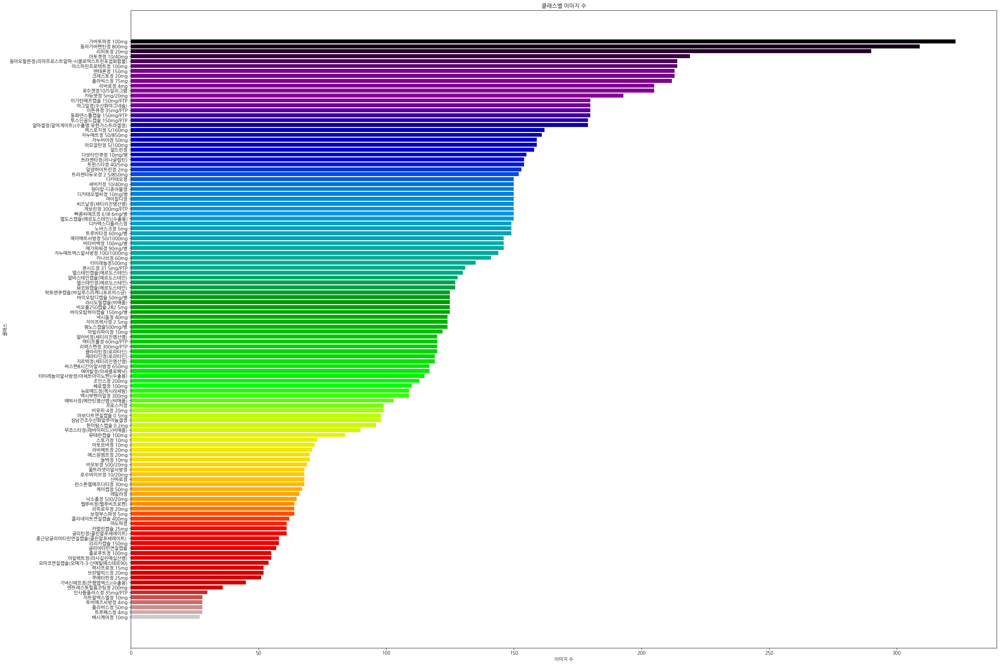

In [17]:
#@title 클래스별 이미지 수
# Windows 한글 폰트 설정 (맑은 고딕)
#plt.rcParams['font.family'] = 'Malgun Gothic'

# 마이너스 기호 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(df)))

plt.figure(figsize=(30, 20))

plt.barh(
    df["name"],
    df["image_count"],
    color=colors
)

plt.xlabel("이미지 수")
plt.ylabel("클래스")
plt.title("클래스별 이미지 수")

plt.gca().invert_yaxis()  # df가 내림차순이면 큰 값이 위로 오게 함
plt.tight_layout();
plt.show();

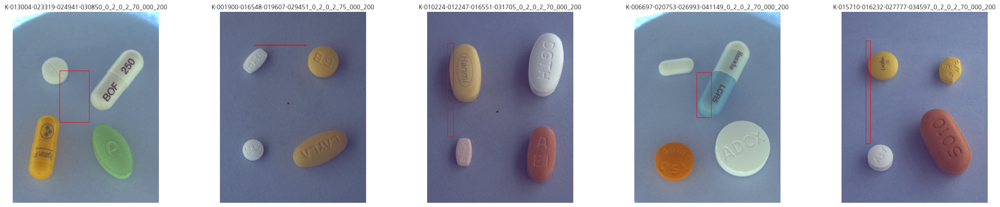

In [18]:
#@title Train 이미지 + Bounding Box 시각화 (랜덤 5개) -- Annotation 조정 전

import json

n_samples = 5
sample_paths = np.random.choice(image_dir, size=n_samples, replace=False)

fig, axes = plt.subplots(1, n_samples, figsize=(5 * n_samples, 5))

for ax, img_path in zip(axes, sample_paths):
    img_stem = os.path.splitext(os.path.basename(img_path))[0]

    # 같은 파일명의 annotation 찾기
    ann_path = next(
        (p for p in annotation_dir if os.path.splitext(os.path.basename(p))[0] == img_stem),
        None
    )

    train_image = cv2.imread(img_path)
    train_image = cv2.cvtColor(train_image, cv2.COLOR_BGR2RGB)

    if ann_path is not None:
        with open(ann_path, "r", encoding="utf-8") as f:
            ann = json.load(f)

        boxes = []
        if "annotations" in ann:
            for obj in ann["annotations"]:
                if "bbox" in obj:
                    boxes.append(obj["bbox"])  # [xmin, ymin, xmax, ymax] 가정
        elif "shapes" in ann:
            for obj in ann["shapes"]:
                if "points" in obj:
                    xs = [p[0] for p in obj["points"]]
                    ys = [p[1] for p in obj["points"]]
                    boxes.append([min(xs), min(ys), max(xs), max(ys)])

        for box in boxes:
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(train_image, (x1, y1), (x2, y2), (255, 0, 0), 2)
    else:
        print(f"'{img_stem}'에 해당하는 annotation을 찾지 못했습니다.")

    ax.imshow(train_image)
    ax.set_title(img_stem, fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()

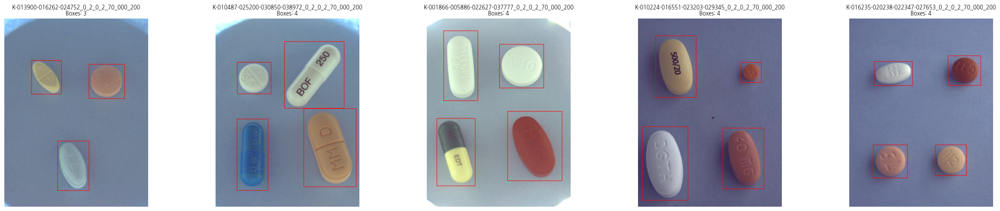

In [19]:
#@title Train 이미지 + Bounding Box 시각화 (XYWH → XYXY 변환 후)

n_samples = min(5, len(image_dir))

sample_paths = np.random.choice(
    image_dir,
    size=n_samples,
    replace=False
)

fig, axes = plt.subplots(
    1,
    n_samples,
    figsize=(5 * n_samples, 5)
)

# 이미지가 1장이어도 반복 가능하게 처리
axes = np.atleast_1d(axes)

for ax, img_path in zip(axes, sample_paths):
    img_stem = os.path.splitext(
        os.path.basename(img_path)
    )[0]

    train_image = cv2.imread(img_path)
    train_image = cv2.cvtColor(
        train_image,
        cv2.COLOR_BGR2RGB
    )

    image_h, image_w = train_image.shape[:2]

    # 여러 annotation JSON을 병합한 record 사용
    record = image_records.get(img_stem)

    if record is None:
        print(
            f"'{img_stem}'에 해당하는 annotation을 "
            "찾지 못했습니다."
        )
        boxes = []
    else:
        boxes = []

        for ann in record["annotations"]:
            # 원본 COCO bbox: [x, y, width, height]
            x, y, bw, bh = ann["bbox"]

            # OpenCV용 XYXY 좌표로 변환
            x1 = int(round(x))
            y1 = int(round(y))
            x2 = int(round(x + bw))
            y2 = int(round(y + bh))

            # 이미지 범위를 벗어나지 않도록 제한
            x1 = max(0, min(x1, image_w - 1))
            y1 = max(0, min(y1, image_h - 1))
            x2 = max(0, min(x2, image_w - 1))
            y2 = max(0, min(y2, image_h - 1))

            if x2 <= x1 or y2 <= y1:
                print(
                    f"잘못된 bbox 제외: "
                    f"{img_stem}, {ann['bbox']}"
                )
                continue

            boxes.append([x1, y1, x2, y2])

            cv2.rectangle(
                train_image,
                (x1, y1),
                (x2, y2),
                (255, 0, 0),
                2
            )

    ax.imshow(train_image)
    ax.set_title(
        f"{img_stem}\nBoxes: {len(boxes)}",
        fontsize=9
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [20]:
#@title label_to_category 매핑 자체 검증
expected_labels = set(range(1, num_classes))  # background(0) 제외
mapped_labels = set(label_to_category.keys())

print(f"모델이 출력 가능한 라벨 범위: {expected_labels}")
print(f"label_to_category에 존재하는 라벨: {mapped_labels}")
print(f"매핑 누락된 라벨: {expected_labels - mapped_labels}")
print(f"매핑 결과 category_id 샘플 5개: {list(label_to_category.items())[:5]}")

모델이 출력 가능한 라벨 범위: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118}
label_to_category에 존재하는 라벨: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116

## STEP 2 : Transform ~ Dataset ~ DataLoader

In [21]:
#@title Transformer
train_transformer = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(dtype=torch.float32, scale=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),
    v2.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.1,
        hue=0.02,
    ),
])

val_test_transformer = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(dtype=torch.float32, scale=True),
])

In [22]:
#@title Pill Dataset 정의
class PillDataset(Dataset):
    def __init__(
        self,
        image_dir,
        image_records,
        stems,
        category_to_label,
        transforms=None
    ):
        self.image_dir = image_dir
        self.image_records = image_records
        self.stems = stems
        self.category_to_label = category_to_label
        self.transforms = transforms

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, idx):
        stem = self.stems[idx]

        # 미리 병합해둔 annotation 정보 가져오기
        record = self.image_records[stem]

        with Image.open(os.path.join(self.image_dir, record["file_name"])) as im:
            image = im.convert("RGB")

        w = record["width"]
        h = record["height"]

        boxes = []
        labels = []
        areas = []
        iscrowd = []

        for ann in record["annotations"]:
            bbox = ann.get("bbox", [])

            if len(bbox) != 4:
              continue

            x, y, bw, bh = bbox

            if bw <= 0 or bh <= 0:
              continue

            boxes.append([x, y, x + bw, y + bh])
            labels.append(
                self.category_to_label[ann["category_id"]]
            )
            areas.append(ann["area"])
            iscrowd.append(ann["iscrowd"])

        image = tv_tensors.Image(image)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        boxes = boxes.reshape(-1, 4) if boxes.numel() else boxes.reshape(0, 4)
        boxes = tv_tensors.BoundingBoxes(
            boxes,
            format="XYXY",
            canvas_size=(h, w)
        )

        target = {
            "boxes": boxes,
            "labels": torch.as_tensor(labels, dtype=torch.int64),
            "image_id": torch.tensor([idx]),
            "area": torch.as_tensor(areas, dtype=torch.float32),
            "iscrowd": torch.as_tensor(iscrowd, dtype=torch.int64),
        }

        if self.transforms:
            image, target = self.transforms(image, target)

        return image, target

In [23]:
#@title Multilabel Stratified Train / Validation Split
from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit

SEED = 42
VAL_RATIO = 0.2
N_CANDIDATES = 200

# 실행 환경마다 glob 순서가 달라지는 것을 방지
stems = np.asarray(sorted(image_records.keys()), dtype=object)

category_ids = np.asarray(
    sorted(category_to_label.keys())
)

category_to_col = {
    category_id: col
    for col, category_id in enumerate(category_ids)
}

# ---------------------------------------------------------
# 이미지별 multi-hot label 행렬 생성
# y[i, j] = i번째 이미지에 j번째 클래스가 있으면 1
# 같은 클래스 객체가 여러 개 있어도 이미지 기준으로는 1
# ---------------------------------------------------------
y = np.zeros(
    (len(stems), len(category_ids)),
    dtype=np.uint8
)

for i, stem in enumerate(stems):
    image_category_ids = {
        ann["category_id"]
        for ann in image_records[stem]["annotations"]
    }

    for category_id in image_category_ids:
        y[i, category_to_col[category_id]] = 1


# 클래스별 등장 이미지 수
total_image_counts = y.sum(axis=0)

# ---------------------------------------------------------
# 등장 이미지가 1장뿐인 클래스는 train/val 양쪽에 배치 불가능
# 학습 자체가 불가능해지는 것을 막기 위해 해당 이미지를 train에 고정
# ---------------------------------------------------------
singleton_cols = np.flatnonzero(total_image_counts == 1)

if len(singleton_cols) > 0:
    forced_train_mask = y[:, singleton_cols].any(axis=1)
    forced_train_idx = np.flatnonzero(forced_train_mask)
else:
    forced_train_idx = np.array([], dtype=np.int64)

all_idx = np.arange(len(stems))
eligible_idx = np.setdiff1d(all_idx, forced_train_idx)

n_valid = max(1, int(round(len(stems) * VAL_RATIO)))

if len(eligible_idx) <= n_valid:
    raise ValueError(
        "Singleton 클래스 이미지를 train에 고정한 뒤 "
        "validation 후보 이미지가 부족합니다."
    )


# ---------------------------------------------------------
# 여러 random seed 후보 중
# 1. train 누락 클래스가 가장 적고
# 2. 충분한 표본이 있는 클래스의 val 누락이 가장 적고
# 3. 클래스별 val 비율이 20%에 가까운 분할 선택
# ---------------------------------------------------------
min_evaluable_count = int(np.ceil(1 / VAL_RATIO))  # 20%이면 5장
evaluable_classes = total_image_counts >= min_evaluable_count

best_result = None

for random_state in range(SEED, SEED + N_CANDIDATES):
    splitter = MultilabelStratifiedShuffleSplit(
        n_splits=1,
        test_size=n_valid,
        random_state=random_state,
    )

    relative_train_idx, relative_valid_idx = next(
        splitter.split(
            np.zeros((len(eligible_idx), 1)),
            y[eligible_idx],
        )
    )

    train_idx = np.concatenate([
        forced_train_idx,
        eligible_idx[relative_train_idx],
    ])
    valid_idx = eligible_idx[relative_valid_idx]

    train_counts = y[train_idx].sum(axis=0)
    valid_counts = y[valid_idx].sum(axis=0)

    missing_train_count = int(
        (train_counts == 0).sum()
    )

    missing_valid_count = int(
        (valid_counts[evaluable_classes] == 0).sum()
    )

    if evaluable_classes.any():
        validation_ratio_error = np.abs(
            valid_counts[evaluable_classes]
            / total_image_counts[evaluable_classes]
            - VAL_RATIO
        ).mean()
    else:
        validation_ratio_error = 0.0

    score = (
        missing_train_count,
        missing_valid_count,
        validation_ratio_error,
    )

    if best_result is None or score < best_result[0]:
        best_result = (
            score,
            train_idx,
            valid_idx,
        )


best_score, train_idx, valid_idx = best_result

train_stems = stems[train_idx].tolist()
valid_stems = stems[valid_idx].tolist()


# ---------------------------------------------------------
# 분할 결과 검증
# ---------------------------------------------------------
split_stats = pd.DataFrame({
    "category_id": category_ids,
    "class_name": [
        category_id_to_name[category_id]
        for category_id in category_ids
    ],
    "all_images": total_image_counts,
    "train_images": y[train_idx].sum(axis=0),
    "valid_images": y[valid_idx].sum(axis=0),
})

split_stats = split_stats.sort_values(
    ["all_images", "category_id"]
).reset_index(drop=True)

print(f"전체 이미지: {len(stems)}")
print(f"Train 이미지: {len(train_stems)}")
print(f"Validation 이미지: {len(valid_stems)}")
print(f"Train 강제 배치 이미지: {len(forced_train_idx)}")
print(f"선택된 split score: {best_score}")

display(split_stats)


# 데이터 누락 및 중복 검증
assert set(train_stems).isdisjoint(valid_stems)
assert len(train_stems) + len(valid_stems) == len(stems)

missing_train = split_stats[
    split_stats["train_images"] == 0
]

missing_valid = split_stats[
    (split_stats["all_images"] >= min_evaluable_count)
    & (split_stats["valid_images"] == 0)
]

if not missing_train.empty:
    display(missing_train)
    raise RuntimeError(
        "Train에 존재하지 않는 클래스가 있습니다."
    )

if not missing_valid.empty:
    display(missing_valid)
    raise RuntimeError(
        f"이미지가 {min_evaluable_count}장 이상인데 "
        "Validation에 없는 클래스가 있습니다."
    )

# 2~4장뿐인 클래스는 validation에 없을 수 있음
rare_missing_valid = split_stats[
    split_stats["all_images"].between(
        2,
        min_evaluable_count - 1
    )
    & (split_stats["valid_images"] == 0)
]

if not rare_missing_valid.empty:
    print(
        "\n주의: 표본이 2~4장뿐이라 Validation에 포함되지 않은 "
        "클래스입니다. 학습 표본 보존을 우선한 정상적인 결과입니다."
    )
    display(rare_missing_valid)

전체 이미지: 3731
Train 이미지: 2973
Validation 이미지: 758
Train 강제 배치 이미지: 0
선택된 split score: (0, 0, np.float64(0.005858715696991653))


,category_id,class_name,all_images,train_images,valid_images
0,K-020852,베시케어정 10mg,27,22,5
1,K-020259,자트랄엑스엘정 10mg,28,22,6
2,K-024752,토비애즈서방정 4mg,28,22,6
3,K-028424,플리바스정 50mg,28,22,6
4,K-033026,트루패스정 4mg,28,22,6
...,...,...,...,...,...
113,K-011220,아스피린프로텍트정 100mg,214,170,44
114,K-035206,아토젯정 10/40mg,219,175,44
115,K-016232,리피토정 20mg,290,231,59
116,K-016551,동아가바펜틴정 800mg,309,247,62


In [24]:
#@title 손상된 학습 이미지 찾기

from PIL import Image
import os

bad_images = []

for stem in train_stems:
    image_path = os.path.join(
        "/content/data/train_images",
        stem + ".png"
    )

    try:
        with Image.open(image_path) as img:
            img.verify()

        # verify 후 실제 pixel decode도 확인
        with Image.open(image_path) as img:
            img.load()

    except Exception as e:
        bad_images.append((stem, image_path, str(e)))

print(f"문제가 있는 이미지 수: {len(bad_images)}")

for stem, path, error in bad_images:
    print("\n------------------------------")
    print("stem :", stem)
    print("path :", path)
    print("error:", error)

문제가 있는 이미지 수: 0


In [25]:
#@title 손상 이미지 제외

bad_stems = {stem for stem, _, _ in bad_images}

train_stems = [
    stem for stem in train_stems
    if stem not in bad_stems
]

valid_stems = [
    stem for stem in valid_stems
    if stem not in bad_stems
]

print(f"제외한 손상 이미지 수: {len(bad_stems)}")
print(f"Train 이미지 수: {len(train_stems)}")
print(f"Validation 이미지 수: {len(valid_stems)}")

제외한 손상 이미지 수: 0
Train 이미지 수: 2973
Validation 이미지 수: 758


In [26]:
#@title 데이터 루트 경로 재설정

path = "/content/data"

print("데이터 루트:", path)
print(
    "train_images:",
    os.path.isdir(os.path.join(path, "train_images"))
)

데이터 루트: /content/data
train_images: True


In [27]:
#@title Dataset ~ DataLoader
train_dataset = PillDataset(
    image_dir=os.path.join(path, "train_images"),
    image_records=image_records, stems=train_stems,
    category_to_label=category_to_label, transforms=train_transformer,
)
valid_dataset = PillDataset(
    image_dir=os.path.join(path, "train_images"),
    image_records=image_records, stems=valid_stems,
    category_to_label=category_to_label, transforms=val_test_transformer,
)

# lambda를 쓰지 않아 Windows multiprocessing에서도 pickle 오류를 피함
def detection_collate_fn(batch):
    return tuple(zip(*batch))

def make_detection_loader(dataset, batch_size, shuffle):
    kwargs = dict(
        dataset=dataset, batch_size=batch_size, shuffle=shuffle,
        collate_fn=detection_collate_fn, num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
    )
    if NUM_WORKERS > 0:
        kwargs.update(persistent_workers=True, prefetch_factor=2)
    return DataLoader(**kwargs)

train_loader = make_detection_loader(train_dataset, TRAIN_BATCH_SIZE, shuffle=True)
val_loader = make_detection_loader(valid_dataset, EVAL_BATCH_SIZE, shuffle=False)

## STEP 3 : Modelling

### Model & Optimizer

### mAP method

### Train - Validation Loop

### mAP & Loss Visualization

In [28]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(
    weights=FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT,
    min_size=MODEL_MIN_SIZE,
    max_size=MODEL_MAX_SIZE,
    rpn_pre_nms_top_n_train=RPN_PRE_NMS_TOP_N_TRAIN,
    rpn_post_nms_top_n_train=RPN_POST_NMS_TOP_N_TRAIN,
    box_detections_per_img=BOX_DETECTIONS_PER_IMG,
).to(device)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(
    in_features,
    num_classes
).to(device)


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth


100%|██████████| 167M/167M [00:01<00:00, 155MB/s]


In [29]:
#@title Define Optimizer & Scheduler
optimizer = torch.optim.SGD(model.parameters(), lr = LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=SCHEDULER_FACTOR,
    patience=SCHEDULER_PATIENCE,
)

In [30]:
#@title mAP 계산 함수 (IoU threshold 0.75~0.95)
iou_thresholds = [0.75, 0.80, 0.85, 0.90, 0.95]

def evaluate_map(model, data_loader, device):
    was_training = model.training
    model.eval()
    metric = MeanAveragePrecision(iou_type="bbox", iou_thresholds=iou_thresholds)

    # evaluation도 AMP를 사용하면 validation 시간이 크게 줄어듭니다.
    with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
        for images, targets in tqdm(data_loader, desc="Evaluating"):
            images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
            preds = model(images)

            preds_cpu = [
                {
                    "boxes": p["boxes"].float().cpu(),
                    "scores": p["scores"].float().cpu(),
                    "labels": p["labels"].cpu(),
                }
                for p in preds
            ]
            targets_cpu = [{"boxes": t["boxes"].cpu(), "labels": t["labels"].cpu()} for t in targets]

            metric.update(preds_cpu, targets_cpu)

    result = metric.compute()
    if was_training:
        model.train()
    return result

In [31]:
#@title W&B 실험 시작

run = wandb.init(
    entity="jaedong0817-",
    project="beginner-team-project",
    name=EXPERIMENT_NAME,
    job_type="train",
    config={
        "model": "FasterRCNN_ResNet50_FPN_V2",
        "num_epochs": NUM_EPOCHS,

        "learning_rate": LEARNING_RATE,
        "momentum": MOMENTUM,
        "weight_decay": WEIGHT_DECAY,

        "train_batch_size": TRAIN_BATCH_SIZE,
        "eval_batch_size": EVAL_BATCH_SIZE,

        "model_min_size": MODEL_MIN_SIZE,
        "model_max_size": MODEL_MAX_SIZE,

        "scheduler_factor": SCHEDULER_FACTOR,
        "scheduler_patience": SCHEDULER_PATIENCE,

        "rpn_pre_nms_top_n_train": RPN_PRE_NMS_TOP_N_TRAIN,
        "rpn_post_nms_top_n_train": RPN_POST_NMS_TOP_N_TRAIN,
        "box_detections_per_img": BOX_DETECTIONS_PER_IMG,

        "num_classes": num_classes,
        "iou_thresholds": iou_thresholds
    }
)

# Colab 로컬 저장 경로
CHECKPOINT_PATH = f"best_model_fasterrcnn_{run.id}.pth"

# Google Drive에도 Best 가중치 저장
DRIVE_CHECKPOINT_DIR = "/content/drive/MyDrive/t_proj/checkpoints"
os.makedirs(DRIVE_CHECKPOINT_DIR, exist_ok=True)

DRIVE_CHECKPOINT_PATH = os.path.join(
    DRIVE_CHECKPOINT_DIR,
    f"best_model_fasterrcnn_{run.id}.pth"
)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


In [32]:
stem = "K-000250-000573-002483-006192_0_2_0_2_70_000_200"

print("연결된 JSON 파일:")
for ann_file_path in stem_to_paths[stem]:
    print(ann_file_path)

print("\n첫 번째 JSON 내용:")
with open(stem_to_paths[stem][0], "r", encoding="utf-8") as f:
    data = json.load(f)

print(json.dumps(data, ensure_ascii=False, indent=2))

연결된 JSON 파일:
/content/data/train_annotations/K-000250-000573-002483-006192_json/K-006192/K-000250-000573-002483-006192_0_2_0_2_70_000_200.json
/content/data/train_annotations/K-000250-000573-002483-006192_json/K-000250/K-000250-000573-002483-006192_0_2_0_2_70_000_200.json
/content/data/train_annotations/K-000250-000573-002483-006192_json/K-002483/K-000250-000573-002483-006192_0_2_0_2_70_000_200.json
/content/data/train_annotations/K-000250-000573-002483-006192_json/K-000573/K-000250-000573-002483-006192_0_2_0_2_70_000_200.json

첫 번째 JSON 내용:
{
  "images": [
    {
      "file_name": "K-000250-000573-002483-006192_0_2_0_2_70_000_200.png",
      "width": 976,
      "height": 1280,
      "imgfile": "K-000250-000573-002483-006192_0_2_0_2_70_000_200.png",
      "drug_N": "K-006192",
      "drug_S": "정상알약",
      "back_color": "연회색 배경",
      "drug_dir": "앞면",
      "light_color": "주백색",
      "camera_la": 70,
      "camera_lo": 0,
      "size": 200,
      "dl_idx": "6191",
      "dl_mapping_

In [33]:
num_epochs = NUM_EPOCHS
best_map = float("-inf")  # mAP가 0이어도 첫 checkpoint는 저장
train_loss_hist = []
val_map_hist = []
val_map_75_hist = []
val_epoch_hist = []

scaler = torch.cuda.amp.GradScaler(enabled=AMP_ENABLED)

for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0.0

    for images, targets in tqdm(train_loader, desc=f"Epoch {epoch+1} Training"):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        targets = [
            {k: v.to(device, non_blocking=PIN_MEMORY) for k, v in t.items()}
            for t in targets
        ]

        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=AMP_ENABLED):
            loss_dict = model(images, targets)
            losses = sum(loss_dict.values())

        scaler.scale(losses).backward()
        scaler.step(optimizer)
        scaler.update()

        total_train_loss += losses.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_hist.append(avg_train_loss)

    print(f"Epoch {epoch + 1}/{num_epochs} | Train Loss: {avg_train_loss:.4f}")

    val_map = evaluate_map(model, val_loader, device)
    current_map = val_map["map"].item()
    current_map_75 = val_map["map_75"].item()
    lr_scheduler.step(current_map)

    val_epoch_hist.append(epoch + 1)
    val_map_hist.append(current_map)
    val_map_75_hist.append(current_map_75)
    print(
        f"Epoch {epoch + 1}/{num_epochs} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"mAP[.75:.95]: {current_map:.4f} | "
        f"mAP@75: {current_map_75:.4f}"
    )

    current_lr = optimizer.param_groups[0]["lr"]
    run.log({
        "epoch": epoch + 1,
        "train/loss": avg_train_loss,
        "validation/mAP_75_95": current_map,
        "validation/mAP_75": current_map_75,
        "learning_rate": current_lr
    })

    if current_map > best_map:
      best_map = current_map

      checkpoint_data = {
          "epoch": epoch + 1,
          "model_state_dict": model.state_dict(),
          "optimizer_state_dict": optimizer.state_dict(),
          "scheduler_state_dict": lr_scheduler.state_dict(),
          "best_map": best_map,
          }
      torch.save(checkpoint_data, CHECKPOINT_PATH)
      torch.save(checkpoint_data, DRIVE_CHECKPOINT_PATH)
      print(f"  → New best model saved (mAP: {best_map:.4f})")
      print(f"  → Google Drive 저장: {DRIVE_CHECKPOINT_PATH}")

/tmp/ipykernel_1930/159113046.py:8: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=AMP_ENABLED)
Epoch 1 Training:   0%|          | 0/372 [00:00<?, ?it/s]/tmp/ipykernel_1930/159113046.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=AMP_ENABLED):
Epoch 1 Training: 100%|██████████| 372/372 [15:46<00:00,  2.54s/it]
/tmp/ipykernel_1930/1616001805.py:10: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):


Epoch 1/10 | Train Loss: 1.3643


Evaluating: 100%|██████████| 95/95 [01:39<00:00,  1.05s/it]


Epoch 1/10 | Train Loss: 1.3643 | mAP[.75:.95]: 0.2878 | mAP@75: 0.5293
  → New best model saved (mAP: 0.2878)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 2 Training: 100%|██████████| 372/372 [15:02<00:00,  2.43s/it]


Epoch 2/10 | Train Loss: 0.4740


Evaluating: 100%|██████████| 95/95 [01:17<00:00,  1.22it/s]


Epoch 2/10 | Train Loss: 0.4740 | mAP[.75:.95]: 0.5091 | mAP@75: 0.8945
  → New best model saved (mAP: 0.5091)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 3 Training: 100%|██████████| 372/372 [15:09<00:00,  2.45s/it]


Epoch 3/10 | Train Loss: 0.2561


Evaluating: 100%|██████████| 95/95 [01:10<00:00,  1.35it/s]


Epoch 3/10 | Train Loss: 0.2561 | mAP[.75:.95]: 0.5870 | mAP@75: 0.9384
  → New best model saved (mAP: 0.5870)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 4 Training: 100%|██████████| 372/372 [15:16<00:00,  2.46s/it]


Epoch 4/10 | Train Loss: 0.1864


Evaluating: 100%|██████████| 95/95 [01:21<00:00,  1.17it/s]


Epoch 4/10 | Train Loss: 0.1864 | mAP[.75:.95]: 0.6391 | mAP@75: 0.9560
  → New best model saved (mAP: 0.6391)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 5 Training: 100%|██████████| 372/372 [15:24<00:00,  2.48s/it]


Epoch 5/10 | Train Loss: 0.1468


Evaluating: 100%|██████████| 95/95 [01:20<00:00,  1.19it/s]


Epoch 5/10 | Train Loss: 0.1468 | mAP[.75:.95]: 0.7071 | mAP@75: 0.9735
  → New best model saved (mAP: 0.7071)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 6 Training: 100%|██████████| 372/372 [15:21<00:00,  2.48s/it]


Epoch 6/10 | Train Loss: 0.1310


Evaluating: 100%|██████████| 95/95 [01:16<00:00,  1.23it/s]


Epoch 6/10 | Train Loss: 0.1310 | mAP[.75:.95]: 0.7284 | mAP@75: 0.9765
  → New best model saved (mAP: 0.7284)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 7 Training: 100%|██████████| 372/372 [15:38<00:00,  2.52s/it]


Epoch 7/10 | Train Loss: 0.1169


Evaluating: 100%|██████████| 95/95 [01:27<00:00,  1.08it/s]


Epoch 7/10 | Train Loss: 0.1169 | mAP[.75:.95]: 0.7491 | mAP@75: 0.9783
  → New best model saved (mAP: 0.7491)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 8 Training: 100%|██████████| 372/372 [15:35<00:00,  2.51s/it]


Epoch 8/10 | Train Loss: 0.1139


Evaluating: 100%|██████████| 95/95 [01:15<00:00,  1.26it/s]


Epoch 8/10 | Train Loss: 0.1139 | mAP[.75:.95]: 0.7644 | mAP@75: 0.9762
  → New best model saved (mAP: 0.7644)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 9 Training: 100%|██████████| 372/372 [15:34<00:00,  2.51s/it]


Epoch 9/10 | Train Loss: 0.1036


Evaluating: 100%|██████████| 95/95 [01:26<00:00,  1.09it/s]


Epoch 9/10 | Train Loss: 0.1036 | mAP[.75:.95]: 0.7828 | mAP@75: 0.9747
  → New best model saved (mAP: 0.7828)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


Epoch 10 Training: 100%|██████████| 372/372 [15:26<00:00,  2.49s/it]


Epoch 10/10 | Train Loss: 0.1011


Evaluating: 100%|██████████| 95/95 [01:23<00:00,  1.14it/s]


Epoch 10/10 | Train Loss: 0.1011 | mAP[.75:.95]: 0.7986 | mAP@75: 0.9755
  → New best model saved (mAP: 0.7986)
  → Google Drive 저장: /content/drive/MyDrive/t_proj/checkpoints/best_model_fasterrcnn_1dv9u6hg.pth


In [34]:
#@title 최고 모델을 W&B Artifact로 업로드

model_artifact = wandb.Artifact(
    name=f"fasterrcnn-{run.id}",
    type="model",
    description=f"Best checkpoint from {EXPERIMENT_NAME}",
    metadata={
        "experiment_name": EXPERIMENT_NAME,
        "run_id": run.id,
        "best_map_75_95": best_map,

        "learning_rate": LEARNING_RATE,
        "momentum": MOMENTUM,
        "weight_decay": WEIGHT_DECAY,

        "train_batch_size": TRAIN_BATCH_SIZE,
        "eval_batch_size": EVAL_BATCH_SIZE,

        "model_min_size": MODEL_MIN_SIZE,
        "model_max_size": MODEL_MAX_SIZE,

        "scheduler_factor": SCHEDULER_FACTOR,
        "scheduler_patience": SCHEDULER_PATIENCE,

        "rpn_pre_nms_top_n_train": RPN_PRE_NMS_TOP_N_TRAIN,
        "rpn_post_nms_top_n_train": RPN_POST_NMS_TOP_N_TRAIN,
        "box_detections_per_img": BOX_DETECTIONS_PER_IMG
    }
)

model_artifact.add_file(CHECKPOINT_PATH)

run.log_artifact(
    model_artifact,
    aliases=["best"]
)

run.finish()

print("Faster R-CNN 실험 및 Artifact 업로드 완료")

epoch,▁▂▃▃▄▅▆▆▇█
learning_rate,▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▂▁▁▁▁▁▁▁
validation/mAP_75,▁▇▇███████
validation/mAP_75_95,▁▄▅▆▇▇▇███
epoch,10
learning_rate,0.003
train/loss,0.10112
validation/mAP_75,0.97549
validation/mAP_75_95,0.79857


Faster R-CNN 실험 및 Artifact 업로드 완료


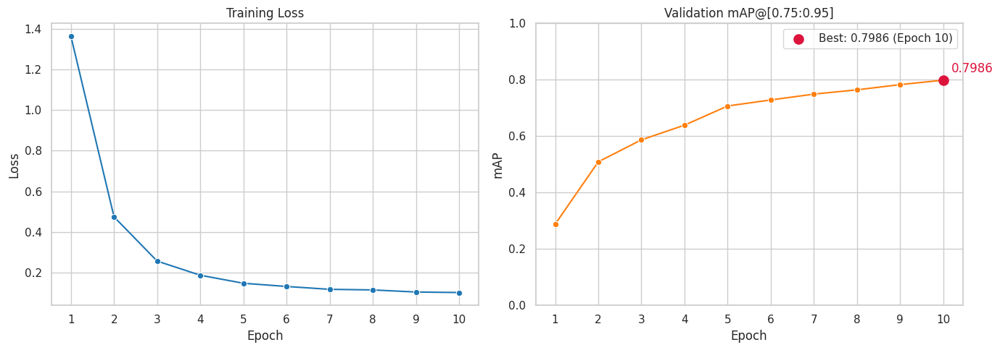

In [35]:
sns.set_theme(style="whitegrid", context="notebook")

epochs = range(1, len(train_loss_hist) + 1)
best_idx = max(range(len(val_map_hist)), key=val_map_hist.__getitem__)
best_epoch = val_epoch_hist[best_idx]
best_score = val_map_hist[best_idx]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Training Loss
sns.lineplot(
    x=list(epochs),
    y=train_loss_hist,
    marker="o",
    color="tab:blue",
    ax=axes[0],
)
axes[0].set_title("Training Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].set_xticks(list(epochs))

# Validation mAP@[0.75:0.95]
sns.lineplot(
    x=val_epoch_hist,
    y=val_map_hist,
    marker="o",
    color="tab:orange",
    ax=axes[1],
)
axes[1].scatter(
    best_epoch,
    best_score,
    color="crimson",
    s=90,
    zorder=3,
    label=f"Best: {best_score:.4f} (Epoch {best_epoch})",
)
axes[1].annotate(
    f"{best_score:.4f}",
    xy=(best_epoch, best_score),
    xytext=(8, 8),
    textcoords="offset points",
    color="crimson",
)
axes[1].set_title("Validation mAP@[0.75:0.95]")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("mAP")
axes[1].set_ylim(0, 1)
axes[1].set_xticks(val_epoch_hist)
axes[1].legend()

plt.tight_layout()
plt.show()

In [36]:
#@title Best 모델 불러오기

checkpoint = torch.load(
    CHECKPOINT_PATH,
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])
model.to(device)
model.eval()

print(f"Best Epoch: {checkpoint['epoch']}")
print(f"Best mAP: {checkpoint['best_map']:.4f}")

Best Epoch: 10
Best mAP: 0.7986


In [37]:
#@title Validation 오탐(False Positive) 분석

from torchvision.ops import box_iou

SCORE_THRESHOLD = 0.3
IOU_THRESHOLD = 0.75

model.eval()

total_tp = 0
total_fp = 0
fp_results = []

with torch.no_grad():

    for images, targets in tqdm(
        val_loader,
        desc="Validation False Positive 분석"
    ):

        images_device = [
            image.to(device)
            for image in images
        ]

        predictions = model(images_device)

        for image, target, pred in zip(
            images,
            targets,
            predictions
        ):

            # 실제 정답
            gt_boxes = target["boxes"].cpu()
            gt_labels = target["labels"].cpu()

            # 모델 예측
            scores = pred["scores"].cpu()

            # confidence 0.5 이상만 사용
            keep = scores >= SCORE_THRESHOLD

            pred_boxes = pred["boxes"].cpu()[keep]
            pred_labels = pred["labels"].cpu()[keep]
            pred_scores = scores[keep]

            matched_gt = set()
            image_fp = []

            for box, label, score in zip(
                pred_boxes,
                pred_labels,
                pred_scores
            ):

                # 같은 클래스의 정답 bbox 찾기
                same_class = torch.where(
                    gt_labels == label
                )[0]

                # 같은 클래스의 GT가 없으면 FP
                if len(same_class) == 0:
                    total_fp += 1
                    image_fp.append(
                        (box, label, score)
                    )
                    continue

                candidate_boxes = gt_boxes[same_class]

                ious = box_iou(
                    box.unsqueeze(0),
                    candidate_boxes
                )[0]

                best_idx = torch.argmax(ious)
                best_iou = ious[best_idx].item()

                gt_idx = same_class[best_idx].item()

                # 클래스 일치 + IoU 0.75 이상 → TP
                if (
                    best_iou >= IOU_THRESHOLD
                    and gt_idx not in matched_gt
                ):
                    total_tp += 1
                    matched_gt.add(gt_idx)

                # 나머지는 FP
                else:
                    total_fp += 1
                    image_fp.append(
                        (box, label, score)
                    )

            # FP가 발생한 이미지만 저장
            if len(image_fp) > 0:
                fp_results.append({
                    "image": image.cpu(),
                    "target": {
                        k: v.cpu()
                        if torch.is_tensor(v)
                        else v
                        for k, v in target.items()
                    },
                    "false_positives": image_fp
                })


print("=" * 50)
print("Validation False Positive 분석 결과")
print("=" * 50)
print(f"Score threshold : {SCORE_THRESHOLD}")
print(f"IoU threshold   : {IOU_THRESHOLD}")
print(f"True Positive   : {total_tp}")
print(f"False Positive  : {total_fp}")
print(f"FP 발생 이미지 수: {len(fp_results)}")

Validation False Positive 분석: 100%|██████████| 95/95 [05:49<00:00,  3.68s/it]

Validation False Positive 분석 결과
Score threshold : 0.3
IoU threshold   : 0.75
True Positive   : 2842
False Positive  : 56
FP 발생 이미지 수: 51


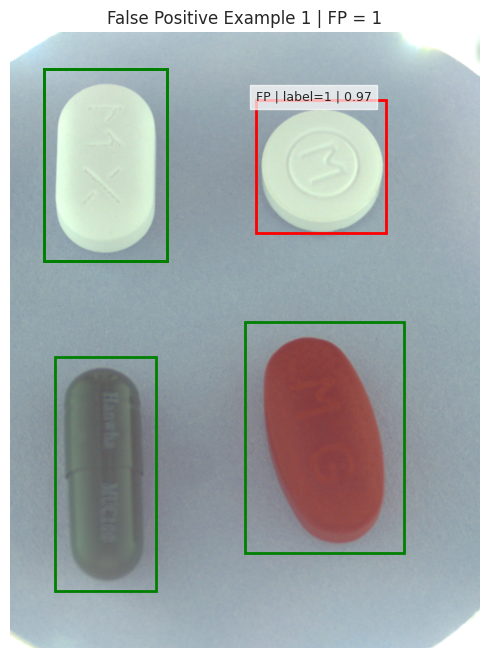

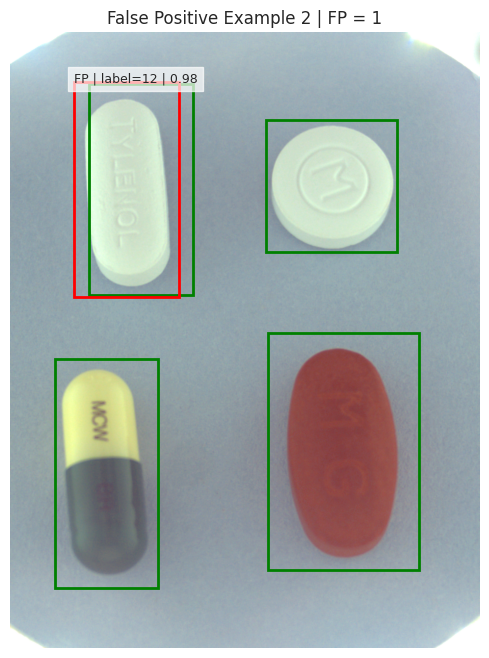

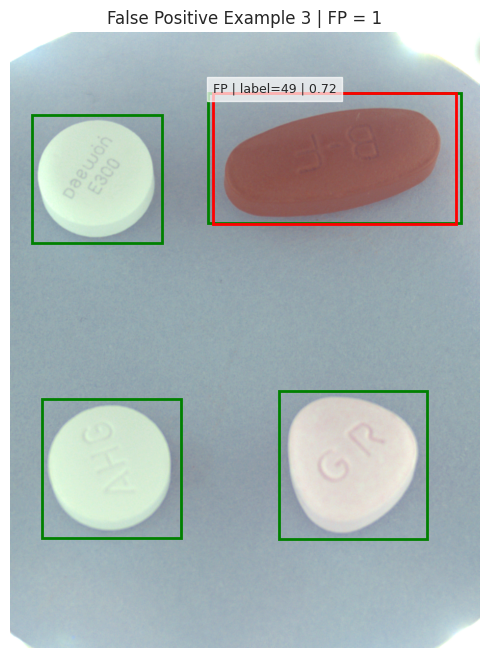

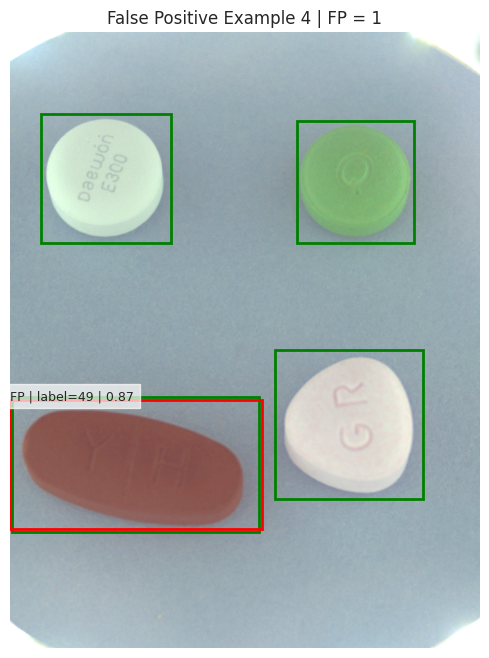

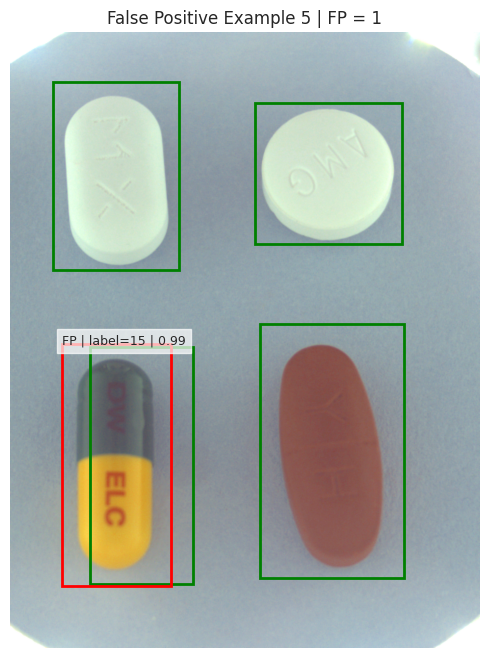

In [38]:
#@title 오탐(False Positive) 이미지 시각화

import matplotlib.pyplot as plt
import matplotlib.patches as patches

NUM_IMAGES = min(5, len(fp_results))

for idx in range(NUM_IMAGES):

    result = fp_results[idx]

    image = result["image"].permute(1, 2, 0).numpy()
    target = result["target"]
    false_positives = result["false_positives"]

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(image)

    # Ground Truth
    for box in target["boxes"]:

        x1, y1, x2, y2 = box.numpy()

        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=2,
            edgecolor="green",
            facecolor="none"
        )

        ax.add_patch(rect)

    # False Positive
    for box, label, score in false_positives:

        x1, y1, x2, y2 = box.numpy()

        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )

        ax.add_patch(rect)

        ax.text(
            x1,
            y1,
            f"FP | label={label.item()} | {score.item():.2f}",
            fontsize=9,
            bbox=dict(
                facecolor="white",
                alpha=0.7
            )
        )

    ax.set_title(
        f"False Positive Example {idx + 1} "
        f"| FP = {len(false_positives)}"
    )

    ax.axis("off")
    plt.show()

## STEP 4 : Test

### Test Class 정의

### Visualization Method & Visualization Loop

### Submission CSV 제작 함수

In [39]:
#@title Test 이미지 경로 설정 및 랜덤 샘플링
test_image_dir = glob.glob(os.path.join(path, "test_images", "*.png"))
print(f"Test 이미지 수: {len(test_image_dir)}")

random.seed(42)
test_sample_paths = random.sample(test_image_dir, min(20, len(test_image_dir)))
test_sample_stems = [os.path.splitext(os.path.basename(p))[0] for p in test_sample_paths]

Test 이미지 수: 842


In [40]:
class TestDataset(Dataset):
    def __init__(self, image_dir, stems, transforms):
        self.image_dir = image_dir
        self.stems = stems
        self.transforms = transforms

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, idx):
        stem = self.stems[idx]

        image = Image.open(
            os.path.join(self.image_dir, f"{stem}.png")
        ).convert("RGB")

        orig_w, orig_h = image.size
        image = tv_tensors.Image(image)

        if self.transforms:
            image = self.transforms(image)

        return image, stem, orig_w, orig_h


test_dataset = TestDataset(
    image_dir=os.path.join(path, "test_images"),
    stems=test_sample_stems,
    transforms=val_test_transformer,
)

test_loader = make_detection_loader(
    test_dataset, batch_size=4, shuffle=False
)

In [41]:
#@title Define method : visualize_prediction
def visualize_prediction(image, prediction, classes, score_thresh=0.5):
    """
    image (torch.Tensor): 추론에 사용된 이미지 (C, H, W).
    prediction (dict): boxes, labels, scores 포함.
    classes (list): index -> 약 이름 매핑 리스트 (0번 = background).
    """
    image = image.permute(1, 2, 0).cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(image)

    for box, label, score in zip(prediction["boxes"], prediction["labels"], prediction["scores"]):
        if score > score_thresh:
            x_min, y_min, x_max, y_max = box.tolist()
            width, height = x_max - x_min, y_max - y_min

            rect = patches.Rectangle(
                (x_min, y_min), width, height,
                linewidth=2, edgecolor="red", facecolor="none"
            )
            ax.add_patch(rect)
            ax.text(
                x_min, max(y_min - 5, 0),
                f"{classes[label.item()]} ({score:.2f})",
                color="white", fontsize=9,
                bbox=dict(facecolor="red", alpha=0.6, pad=1)
            )

    ax.axis("off")
    plt.show()

In [43]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

font_path = "/usr/share/fonts/truetype/nanum/NanumGothic.ttf"

fm.fontManager.addfont(font_path)
plt.rcParams["font.family"] = "NanumGothic"
plt.rcParams["axes.unicode_minus"] = False

print("현재 폰트:", plt.rcParams["font.family"])

현재 폰트: ['NanumGothic']


/tmp/ipykernel_1930/1932759953.py:6: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
Test Inference:   0%|          | 0/5 [00:00<?, ?it/s]

파일명: 1192


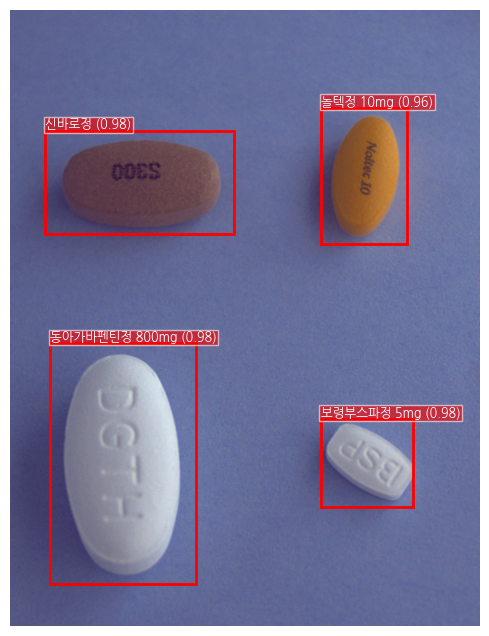

파일명: 338


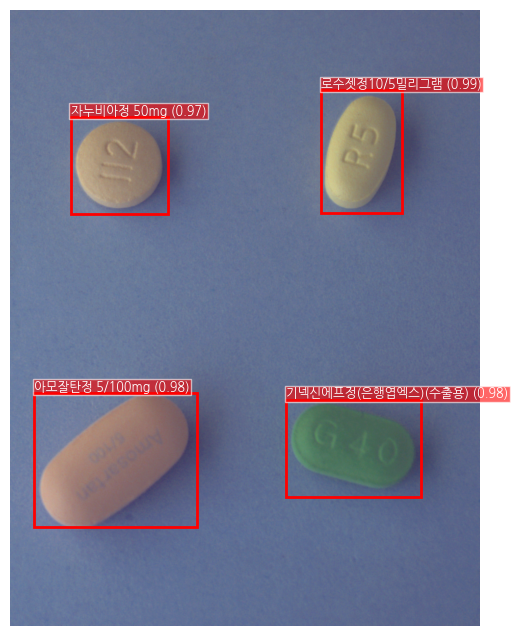

파일명: 1119


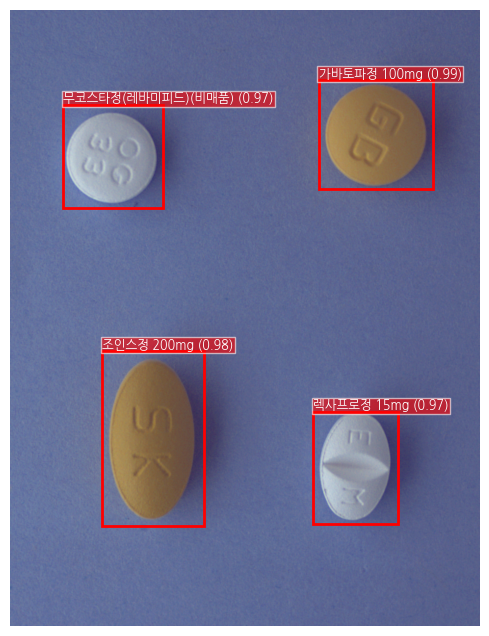

파일명: 565


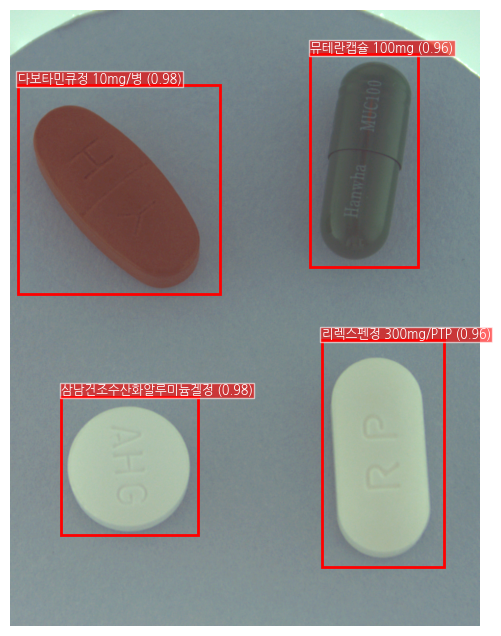

Test Inference:  20%|██        | 1/5 [00:02<00:08,  2.06s/it]

파일명: 1150


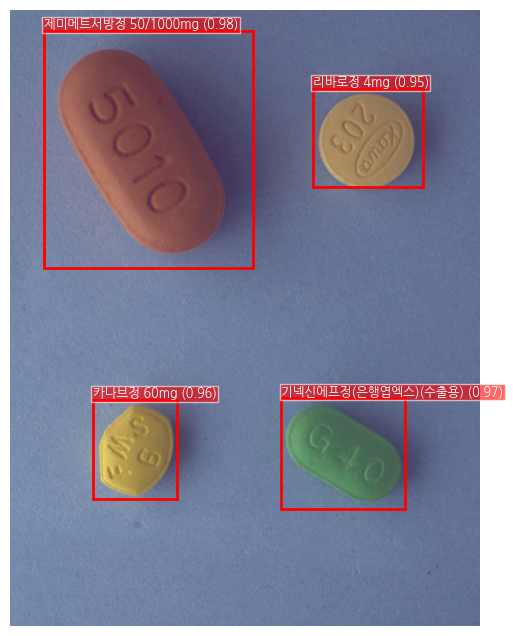

파일명: 506


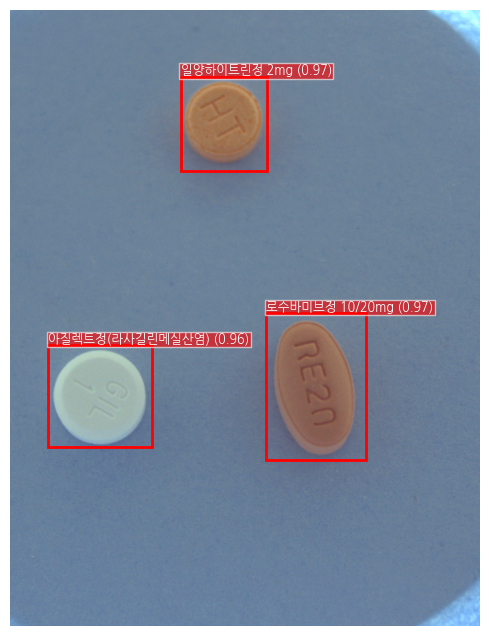

파일명: 1429


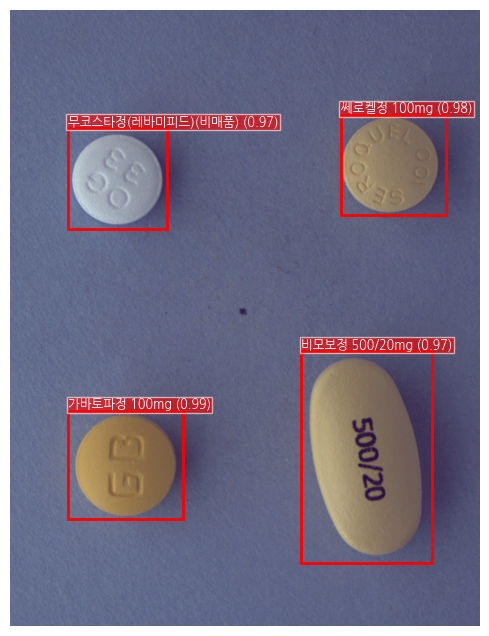

파일명: 826


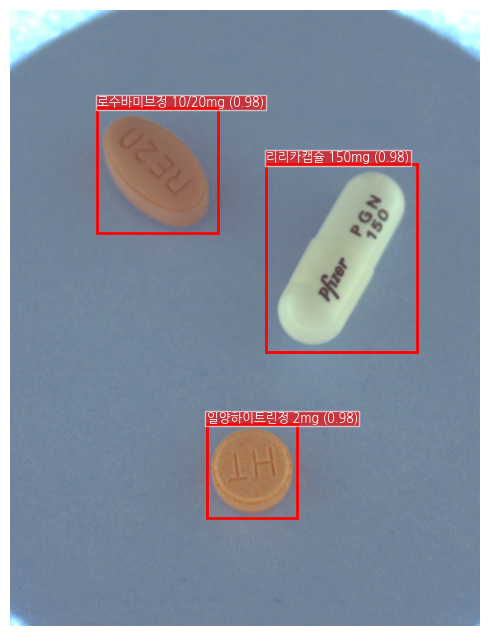

Test Inference:  40%|████      | 2/5 [00:04<00:06,  2.07s/it]

파일명: 532


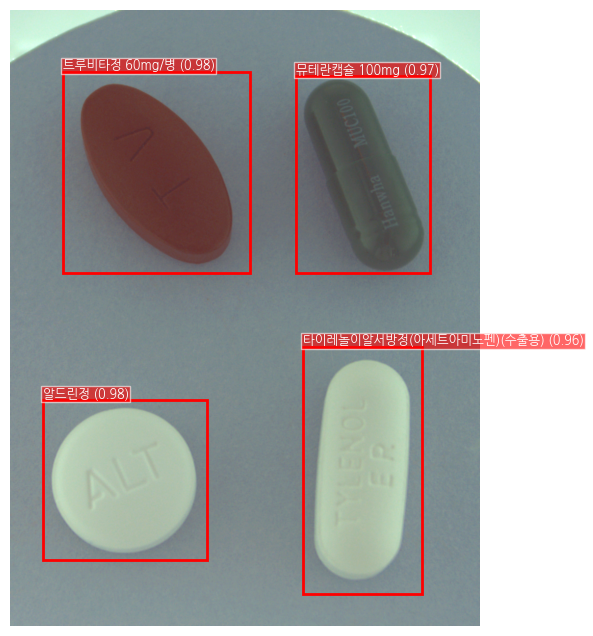

파일명: 576


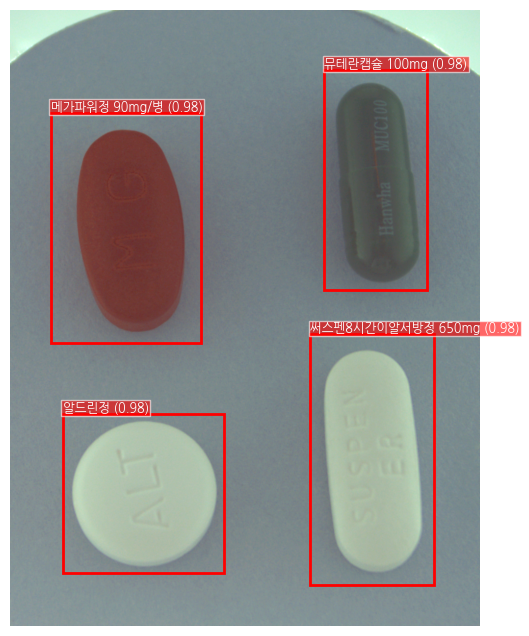

파일명: 1093


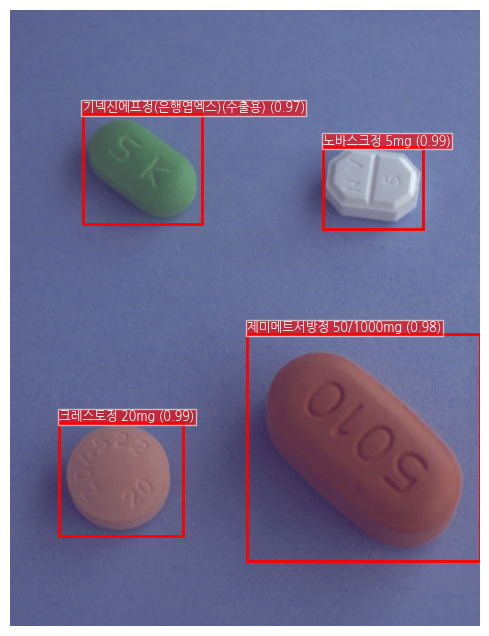

파일명: 1250


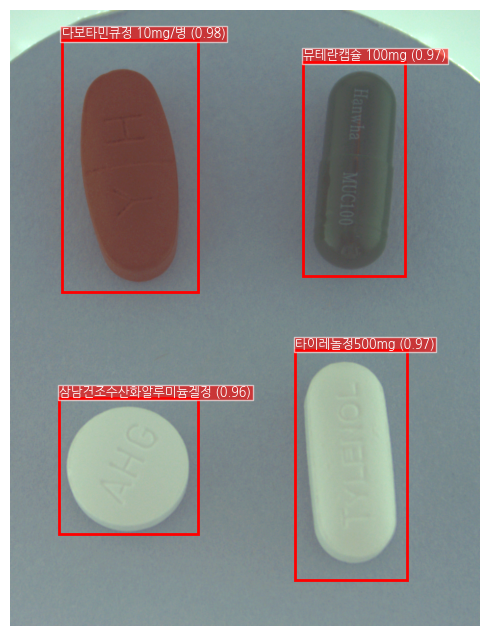

Test Inference:  60%|██████    | 3/5 [00:06<00:04,  2.12s/it]

파일명: 640


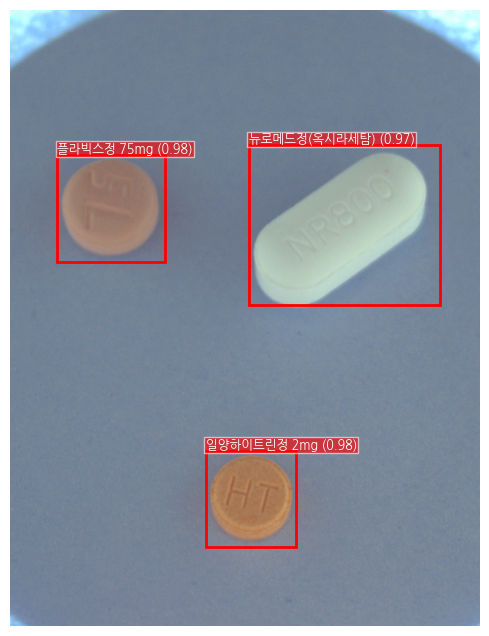

파일명: 650


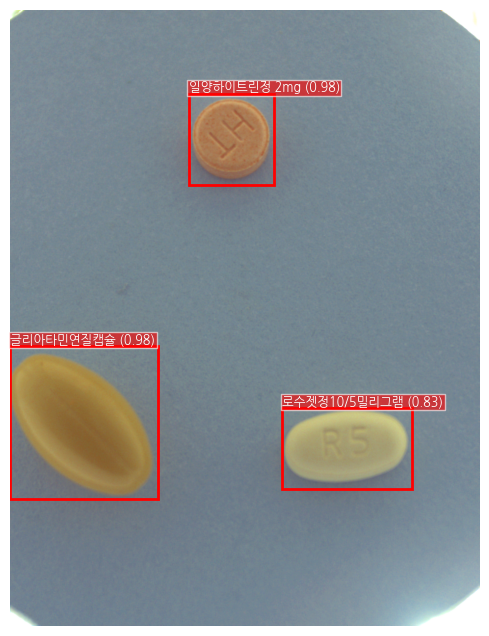

파일명: 625


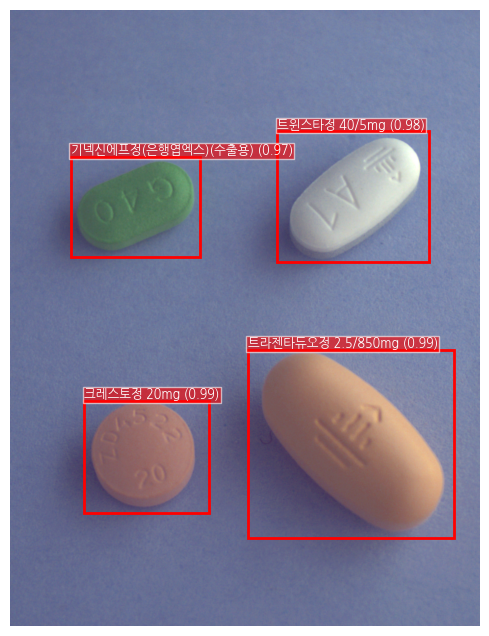

파일명: 698


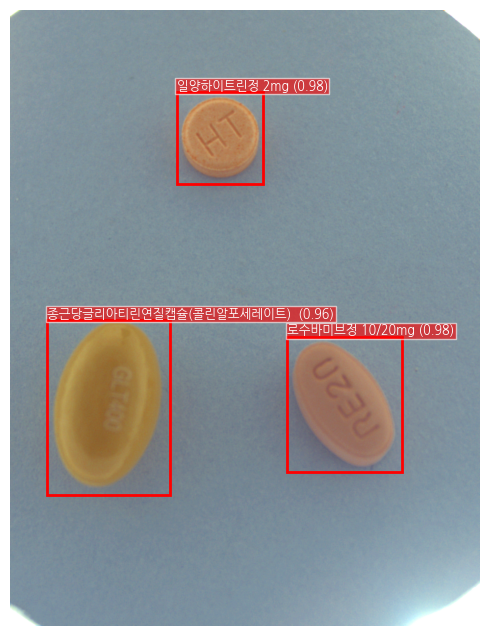

Test Inference:  80%|████████  | 4/5 [00:09<00:02,  2.38s/it]

파일명: 1097


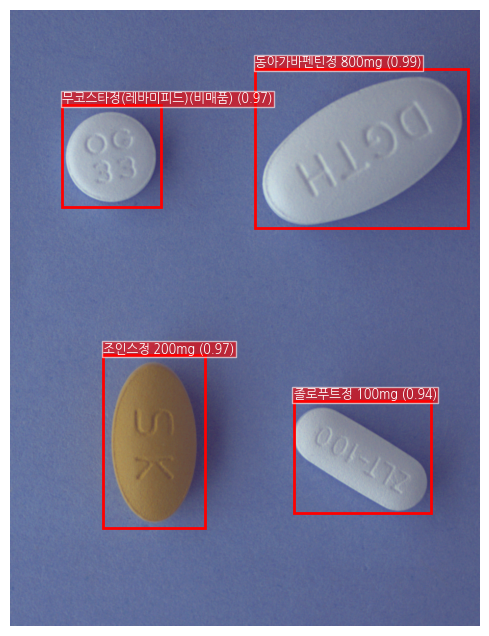

파일명: 684


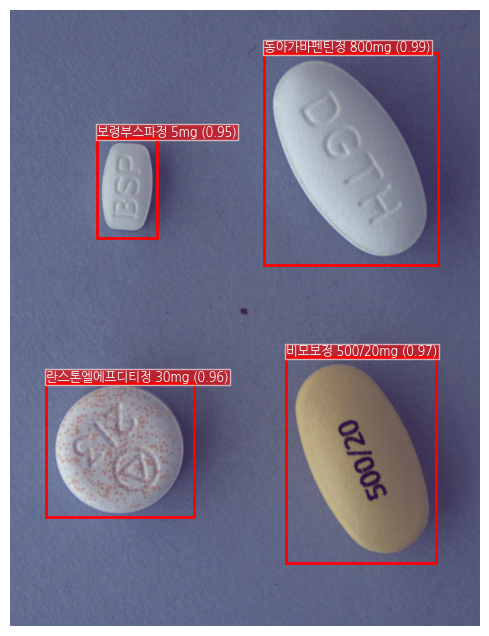

파일명: 380


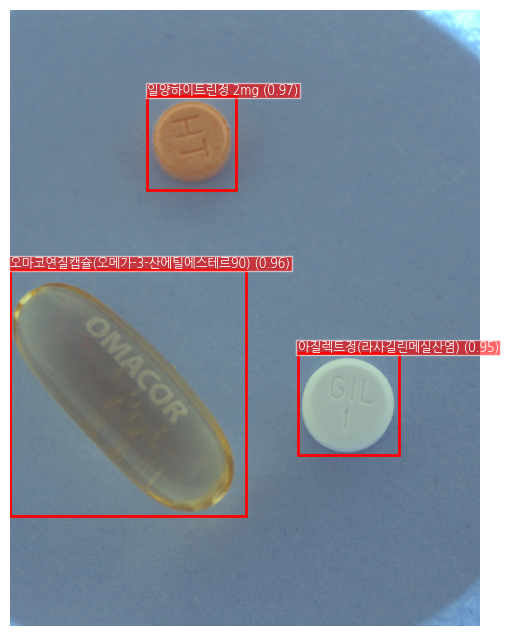

파일명: 759


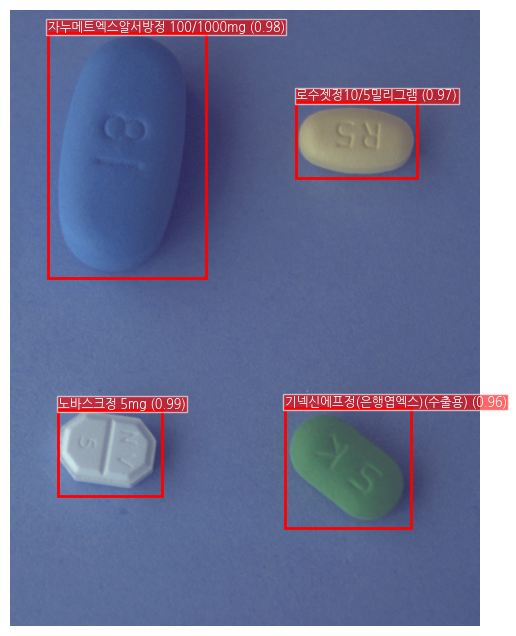

Test Inference: 100%|██████████| 5/5 [00:11<00:00,  2.35s/it]


In [44]:
#@title Test 이미지 20장 추론 및 시각화
checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
    for images, stems, orig_ws, orig_hs in tqdm(test_loader, desc="Test Inference"):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        predictions = model(images)

        for img, pred, stem, orig_w, orig_h in zip(images, predictions, stems, orig_ws, orig_hs):
            print(f"파일명: {stem}")
            visualize_prediction(img.cpu(), pred, classes)

In [45]:
print("num_classes:", num_classes)

print("\nlabel_to_category 앞 10개:")
for label in range(1, min(11, num_classes)):
    print(
        label,
        "->",
        label_to_category[label]
    )

num_classes: 119

label_to_category 앞 10개:
1 -> K-000250
2 -> K-000573
3 -> K-001866
4 -> K-001900
5 -> K-002483
6 -> K-003351
7 -> K-003483
8 -> K-003544
9 -> K-003614
10 -> K-003743


In [46]:
#@title Submission CSV 생성
#int(label_to_category[label.item()].replace("K-", ""))로 K-001900 → 1900처럼 숫자로 변환
model_name = "fasterrcnnresnet50_fpn_v2_fast"

checkpoint = torch.load(
    CHECKPOINT_PATH,
    map_location=device
)
model.load_state_dict(checkpoint["model_state_dict"])

model.to(device)
model.eval()

all_test_paths = sorted(glob.glob(os.path.join(path, "test_images", "*.png")))
all_test_stems = [
    os.path.splitext(os.path.basename(p))[0]
    for p in all_test_paths
]

submission_test_dataset = TestDataset(
    image_dir=os.path.join(path, "test_images"),
    stems=all_test_stems,
    transforms=val_test_transformer
)

submission_test_loader = make_detection_loader(
    submission_test_dataset, batch_size=EVAL_BATCH_SIZE, shuffle=False
)

rows = []
annotation_id = 1
score_thresh = 0.3 # 최적 파라미터

with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
    for images, stems, orig_ws, orig_hs in tqdm(
        submission_test_loader,
        desc="Submission Inference"
    ):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        predictions = model(images)

        for pred, stem, orig_w, orig_h in zip(
            predictions, stems, orig_ws, orig_hs
        ):
            image_id = int(stem)

            boxes = pred["boxes"].cpu()
            labels = pred["labels"].cpu()
            scores = pred["scores"].cpu()

            keep = scores >= score_thresh
            boxes = boxes[keep]
            labels = labels[keep]
            scores = scores[keep]

            for box, label, score in zip(boxes, labels, scores):
                x_min, y_min, x_max, y_max = box.tolist()

                x_min = max(0, min(x_min, orig_w))
                x_max = max(0, min(x_max, orig_w))
                y_min = max(0, min(y_min, orig_h))
                y_max = max(0, min(y_max, orig_h))

                bbox_w = x_max - x_min
                bbox_h = y_max - y_min

                if bbox_w <= 0 or bbox_h <= 0:
                    continue

                rows.append([
                    annotation_id,
                    image_id,
                    int(label_to_category[label.item()].replace("K-", "")),
                    round(x_min, 2),
                    round(y_min, 2),
                    round(bbox_w, 2),
                    round(bbox_h, 2),
                    round(score.item(), 4),
                ])
                annotation_id += 1

submission_filename = f"submission_{model_name}.csv"

with open(submission_filename, "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    writer.writerow([
        "annotation_id", "image_id", "category_id",
        "bbox_x", "bbox_y", "bbox_w", "bbox_h", "score"
    ])
    writer.writerows(rows)

print(f"총 {len(rows)}개 예측 저장 완료 → {submission_filename}")

/tmp/ipykernel_1930/3419030677.py:33: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
Submission Inference: 100%|██████████| 106/106 [01:37<00:00,  1.09it/s]

총 3246개 예측 저장 완료 → submission_fasterrcnnresnet50_fpn_v2_fast.csv
